In [1]:
channelR = "../../data_kiwi_soap/results/duck/duck/test_channelR_2/iter_1.exr"
channelG = "../../data_kiwi_soap/results/duck/duck/test_channelG_2/iter_1.exr"
channelB = "../../data_kiwi_soap/results/duck/duck/test_channelB_2/iter_1.exr"

channelR = "../../data_kiwi_soap/results/head/test_splitR_2/iter_1.exr"
channelG = "../../data_kiwi_soap/results/head/test_splitG_2/iter_1.exr"
channelB = "../../data_kiwi_soap/results/head/test_splitB_2/iter_1.exr"

In [3]:
import mitsuba as mi

mi.set_variant('scalar_rgb')

[mitsuba] Warning: Couldn't import the ipywidgets package. Installing this package is required for the system to properly log messages and print in Jupyter notebooks!


In [16]:
tmp = mi.Bitmap(channelR)

import numpy as np
# R = np.array(tmp)
# G = np.array(mi.Bitmap(channelG))

# B = np.array(mi.Bitmap(channelB))
tmp

Bitmap[
  pixel_format = rgb,
  component_format = float32,
  size = [2560, 1536],
  srgb_gamma = 0,
  struct = Struct<12>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
  ],
  metadata = {
    pixelAspectRatio => 1,
    screenWindowWidth => 1
  },
  data = [ 45 MiB of image data ]
]

In [18]:
mi.Bitmap(channelB)

Bitmap[
  pixel_format = rgb,
  component_format = float32,
  size = [2560, 1536],
  srgb_gamma = 0,
  struct = Struct<12>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
  ],
  metadata = {
    pixelAspectRatio => 1,
    screenWindowWidth => 1
  },
  data = [ 45 MiB of image data ]
]

In [17]:
mi.Bitmap(channelG)

Bitmap[
  pixel_format = rgb,
  component_format = float32,
  size = [2560, 1536],
  srgb_gamma = 0,
  struct = Struct<12>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
  ],
  metadata = {
    pixelAspectRatio => 1,
    screenWindowWidth => 1
  },
  data = [ 45 MiB of image data ]
]

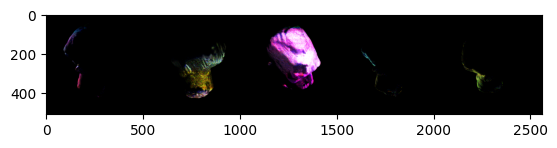

In [5]:
rgb = np.stack((R[:512,:,0],G[:512,:,1],B[:512,:,2]),axis=-1)#,axis=-1)
rgb.shape

from matplotlib import pyplot as plt
plt.imshow(rgb)

In [14]:
import OpenEXR
import Imath
import numpy as np

def read_exr_channel(file_name, channel_name):
    exr_file = OpenEXR.InputFile(file_name)
    dw = exr_file.header()['dataWindow']
    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)

    pt = Imath.PixelType(Imath.PixelType.FLOAT)
    data_str = exr_file.channel(channel_name, pt)
    data = np.frombuffer(data_str, dtype=np.float32)
    data.shape = (size[1], size[0])  # height, width
    return data

# Read each color channel from corresponding EXR files
red_channel = read_exr_channel(channelR, 'R')
green_channel = read_exr_channel(channelG, 'G')
blue_channel = read_exr_channel(channelB, 'B')

# Ensure all channels are of the same dimension
assert red_channel.shape == green_channel.shape == blue_channel.shape

# Merge channels into one image
merged_channels = np.stack([red_channel, green_channel, blue_channel], axis=-1)

# Write the merged channels to a new EXR file
header = OpenEXR.Header(red_channel.shape[1], red_channel.shape[0])
header['channels'] = {
    'R': Imath.Channel(Imath.PixelType(Imath.PixelType.FLOAT)),
    'G': Imath.Channel(Imath.PixelType(Imath.PixelType.FLOAT)),
    'B': Imath.Channel(Imath.PixelType(Imath.PixelType.FLOAT)),
}

out_file = OpenEXR.OutputFile('merged.exr', header)
out_file.writePixels({
    'R': merged_channels[:,:,0].tobytes(),
    'G': merged_channels[:,:,1].tobytes(),
    'B': merged_channels[:,:,2].tobytes()
})
out_file.close()

In [15]:
mi.Bitmap("merged.exr")


Bitmap[
  pixel_format = rgb,
  component_format = float32,
  size = [2560, 1536],
  srgb_gamma = 0,
  struct = Struct<12>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
  ],
  metadata = {
    pixelAspectRatio => 1,
    screenWindowWidth => 1
  },
  data = [ 45 MiB of image data ]
]